In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from pathlib import Path

# Case Study of Amon Millner, Jesse Austin-B's Office

In [4]:
file = "data/combined_milas_hall/Flo2.3-A2-27.csv"
df = pd.read_csv(file)
df.head()

,timestamp,DprPos,FlSpt,HwVlvPos,RmTmp,RmTmpCspt,RmTmpHpst,SaFl
0,2020-10-09 10:00:00,13.195312,150.0,22.65625,68.757812,70.0,69.0,140.0
1,2020-10-09 10:15:00,13.195312,150.0,0.00000,69.117188,70.0,69.0,143.0
2,2020-10-09 10:30:00,13.195312,150.0,14.06250,68.898438,70.0,69.0,134.0
3,2020-10-09 10:45:00,13.195312,150.0,18.75000,68.765625,70.0,69.0,129.0
4,2020-10-09 11:00:00,13.195312,150.0,0.00000,69.250000,70.0,69.0,141.0


In [5]:
filtered_df = df[100000:300000]
filtered_df = filtered_df.copy()  # Avoid "Setting with a copy" warning
filtered_df['timestamp'] = pd.to_datetime(filtered_df['timestamp'])
filtered_df['date'] = filtered_df['timestamp'].dt.date

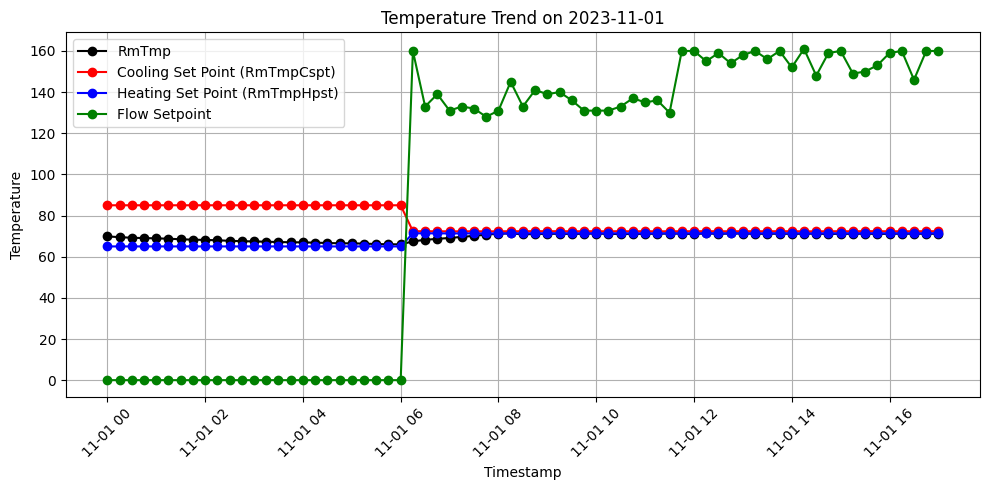

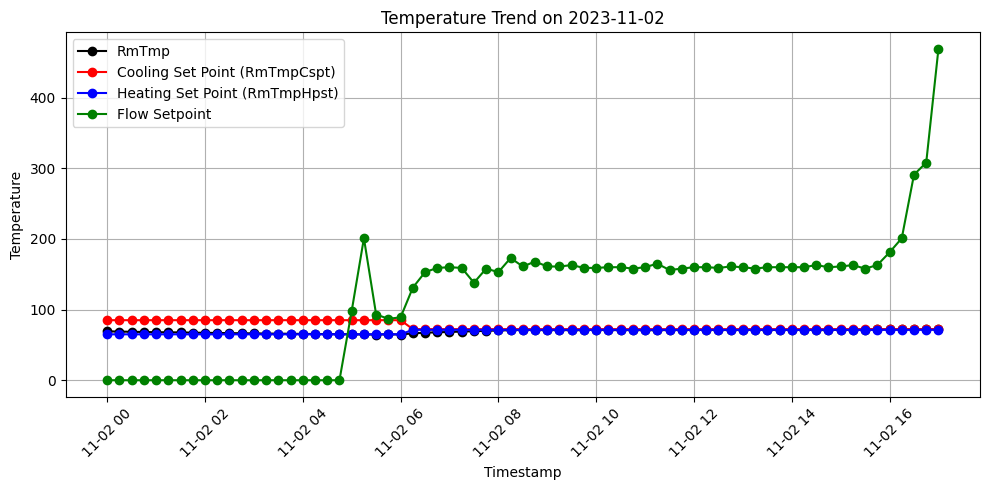

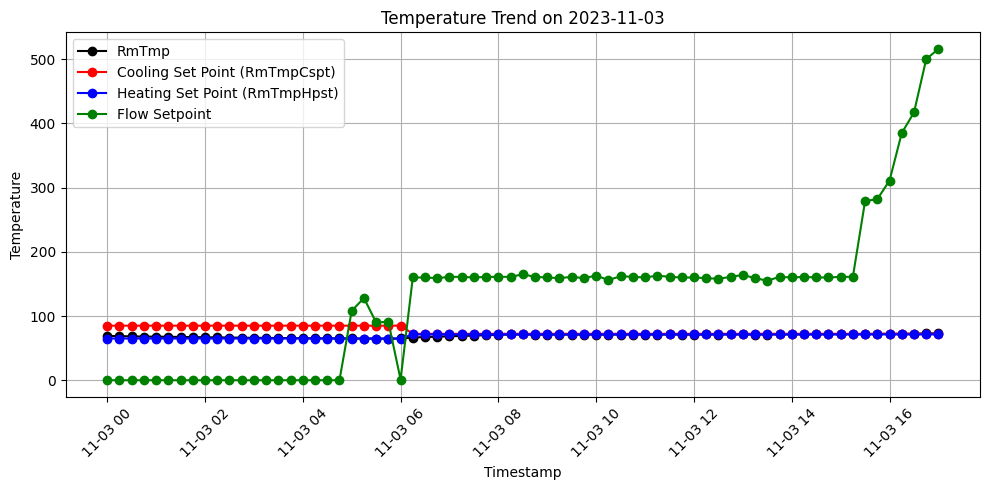

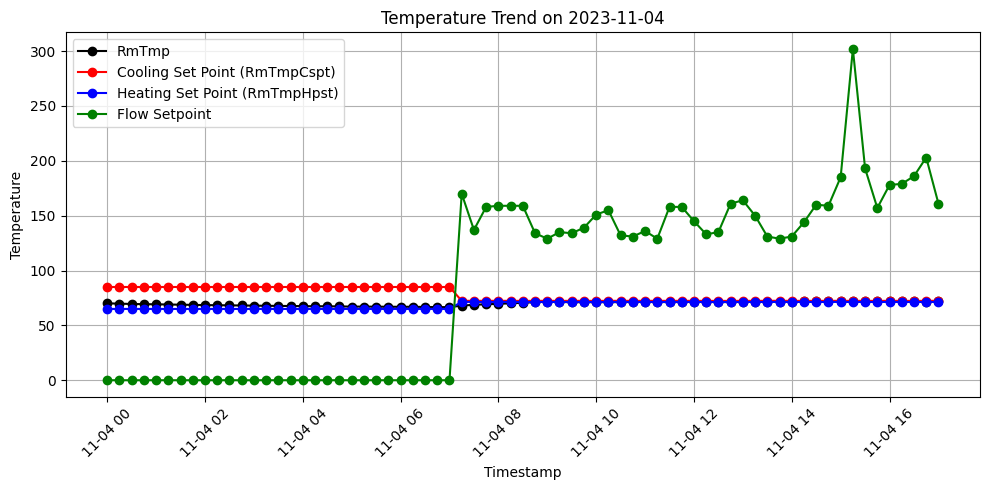

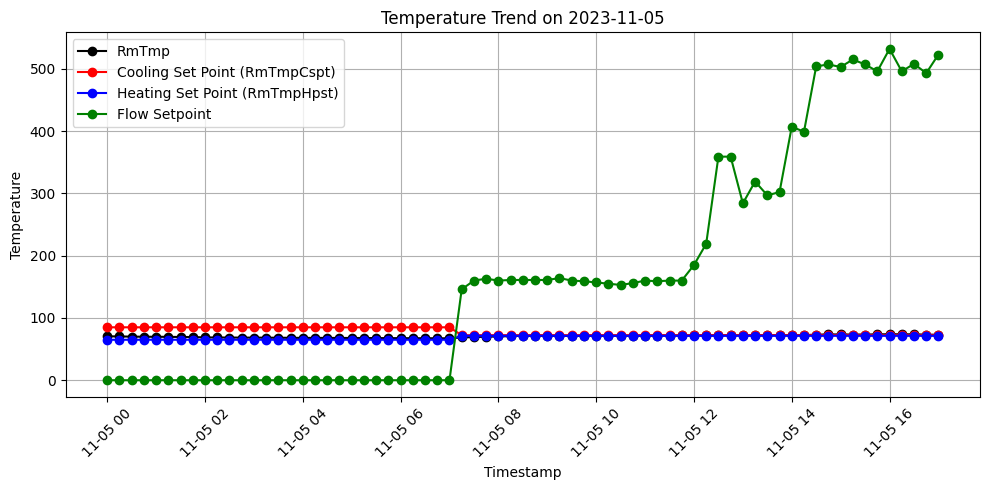

...

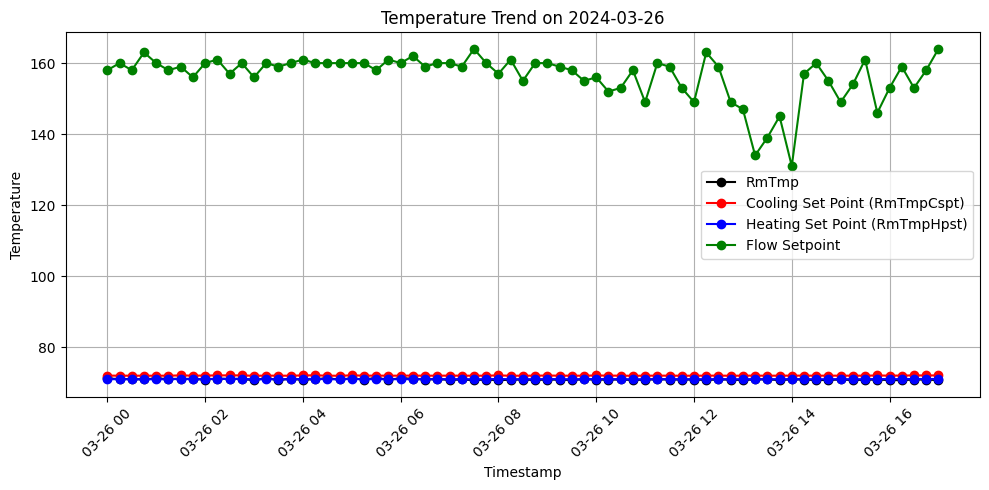

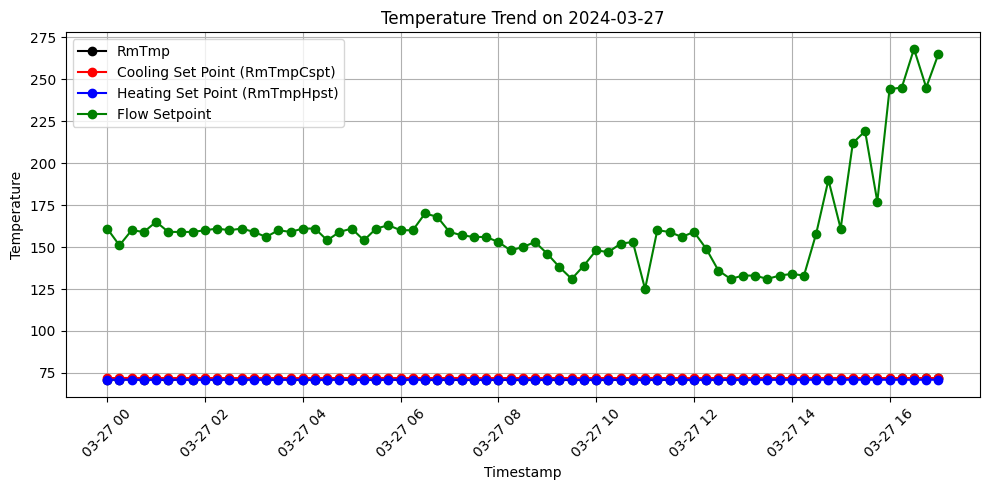

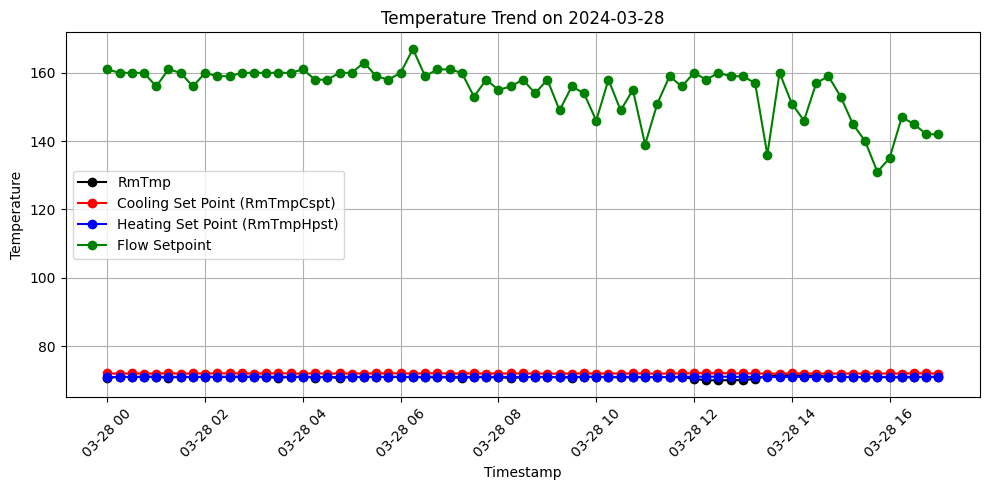

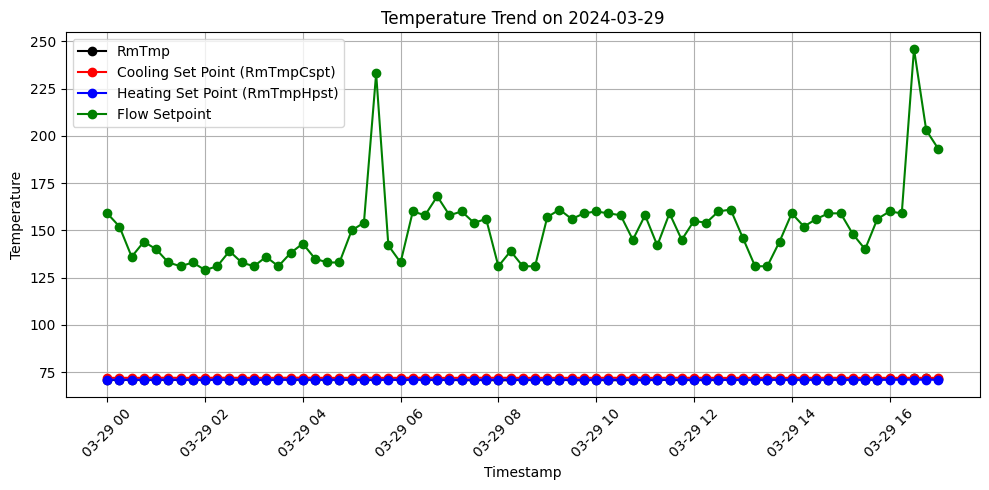

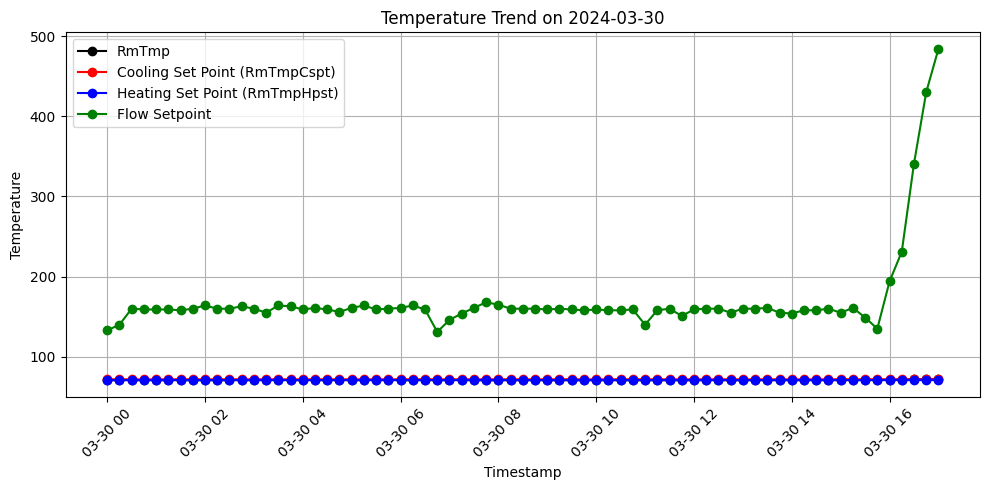

In [7]:
start_date = pd.to_datetime("2023-11-01").date()
end_date = pd.to_datetime("2024-03-30").date()
start_time = "00:00:00"
end_time = "17:00:00"
df_filtered_by_date = filtered_df[
    (filtered_df['date'] >= start_date) & (filtered_df['date'] <= end_date)
]

for date in pd.date_range(start=start_date, end=end_date).date:
    daily_data  = df_filtered_by_date[(df_filtered_by_date['timestamp'].dt.date == date) & \
                                        (df_filtered_by_date['timestamp'].dt.time >= pd.to_datetime(start_time).time()) & \
                                        (df_filtered_by_date['timestamp'].dt.time <= pd.to_datetime(end_time).time())]
    
    if daily_data.empty:
        continue
    
    # Plotting placeholder
    plt.figure(figsize=(10, 5))
    plt.plot(daily_data['timestamp'], daily_data['RmTmp'], color='black', label='RmTmp',marker='o', linestyle='-')
    plt.plot(daily_data['timestamp'], daily_data['RmTmpCspt'], color='red', label='Cooling Set Point (RmTmpCspt)',marker='o')
    plt.plot(daily_data['timestamp'], daily_data['RmTmpHpst'], color='blue', label='Heating Set Point (RmTmpHpst)',marker='o')
    plt.plot(daily_data['timestamp'], daily_data['SaFl'], color='green', label='Flow Setpoint',marker='o')

    plt.title(f"Temperature Trend on {date}")
    plt.xlabel('Timestamp')
    plt.ylabel('Temperature')
    # plt.ylim(50, 90)
    plt.legend()
    plt.grid()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()